<a href="https://colab.research.google.com/github/arnavdodiedo/RL-Algorithms/blob/main/REINFORCE_algorithm.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CartPole-v0 with REINFORCE

In [ ]:
import gym
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F

In [ ]:
!apt update && apt install xvfb
!pip install gym-notebook-wrapper

Get:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Get:2 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Hit:3 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:4 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Get:5 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Ign:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Hit:7 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Ign:8 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:9 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease
Hit:10 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Hit:11 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:12 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Get:13 http://ppa

In [ ]:
episodes = 1000
steps = 800
gamma = 0.9
DEVICE = "cuda"

In [ ]:
class policymodel(nn.Module):
    def __init__(self, inputdim, outputdim):
        super(policymodel, self).__init__()
        self.num_actions = outputdim
        self.num_input = inputdim

        self.layer1 = nn.Linear(self.num_input, 64)
        self.drp1 = nn.Dropout(0.5, inplace=True)
        self.layer2 = nn.Linear(64,128)
        self.drp2 = nn.Dropout(0.5, inplace=True)
        self.layer3 = nn.Linear(128,32)
        self.drp3 = nn.Dropout(0.5, inplace=True)
        self.layer4 = nn.Linear(32, self.num_actions)

    def forward(self, x):
        x = torch.tensor(x, dtype=torch.float32, device=DEVICE).unsqueeze(0)
        x = F.relu(self.drp1(self.layer1(x)))
        x = F.relu(self.drp2(self.layer2(x)))
        x = F.relu(self.drp3(self.layer3(x)))
        x = F.softmax(self.layer4(x))

        action = self.get_action(x)
        log_prob_of_action = torch.log(x.squeeze(0))[action]

        return action, log_prob_of_action
    
    def get_action(self, a):
        return np.random.choice([0,1], p=a.squeeze(0).detach().cpu().numpy())


In [ ]:
env = gym.make("CartPole-v0")
model = policymodel(4,2).to(DEVICE)

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

all_rewards = []

for epi in range(episodes):
    done = False
    state = env.reset()
    log_prb = []
    a, r, d, s = [], [], [], []

    for step in range(steps):
        action, log_p = model(state)
        log_prb.append(log_p)

        state, r_, done, i_ = env.step(action)

        r.append(r_)

        if done:
            all_rewards.append(np.sum(r))
            if epi%100==0: print(f"EPISODE {epi} SCORE: {np.sum(r)} roll{pd.Series(all_rewards).tail(30).mean()}")
            break

    discounted_rewards = []

    for i in range(len(r)):
        gt = 0
        pw = 0

        for j in r[i:]:
            gt = gt + gamma**pw * j
            pw = pw + 1 
        
        discounted_rewards.append(gt)

    discounted_rewards = np.array(discounted_rewards)

    dr = torch.tensor(discounted_rewards, dtype=torch.float32, device=DEVICE)
    dr = (dr-torch.mean(dr))/torch.std(dr)

    log_prb = torch.stack(log_prb)

    grad = -log_prb*dr

    model.zero_grad()
    grad.sum().backward()
    optimizer.step()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


EPISODE 0 SCORE: 15.0 roll15.0
EPISODE 100 SCORE: 13.0 roll23.5
EPISODE 200 SCORE: 25.0 roll32.96666666666667
EPISODE 300 SCORE: 47.0 roll64.56666666666666
EPISODE 400 SCORE: 144.0 roll169.9
EPISODE 500 SCORE: 200.0 roll168.33333333333334
EPISODE 600 SCORE: 52.0 roll92.5
EPISODE 700 SCORE: 88.0 roll175.36666666666667
EPISODE 800 SCORE: 92.0 roll133.5
EPISODE 900 SCORE: 200.0 roll195.63333333333333


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


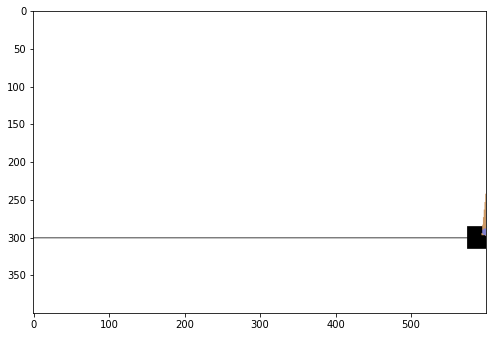

In [ ]:
import matplotlib.animation as animation
import gnwrapper
from PIL import ImageFont, ImageDraw, Image
import numpy as np
import cv2
model.eval()


ACTION_SPACE = [0,1]
env = gnwrapper.LoopAnimation(gym.make('CartPole-v1'))
# env = gym.make("CartPole-v0")
state = env.reset()
ims = []
rewards = []
for step in range(500):
    # env.render()
    env.render(mode='rgb_array')
    # print(img)
    action,log_prob = model(state)
    # print(action)
    state,reward,done,_ = env.step(action)
    # print(reward)
    rewards.append(reward)

    if done: break

env.display()


In [ ]:
sum(rewards)

397.0

# MountainCar-v0 with REINFORCE

In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as f
import matplotlib.pyplot as plt
from tqdm import tqdm
import gym

In [2]:
!apt update && apt install xvfb
!pip install gym-notebook-wrapper

Get:1 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Hit:2 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease
Ign:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Hit:4 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease
Hit:5 http://archive.ubuntu.com/ubuntu bionic InRelease
Ign:6 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:7 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Hit:8 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:9 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:10 http://security.ubuntu.com/ubuntu bionic-security/universe amd64 Packages [1,415 kB]
Hit:11 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Get:12 http://security.ubuntu.com/ubuntu bionic-security/main amd64 Packages [2,185 kB]
Hit:1

In [29]:
class policy():
    def __init__(self, input_dim, output_dim, lr):
        torch.manual_seed(0)
        self.input_dim = input_dim
        self.output_dim = output_dim
        self.lr = lr
        self.policymodel = self.get_model(self.input_dim, self.output_dim).cuda()
        self.optimizer = torch.optim.Adam(self.policymodel.parameters(), lr=self.lr)
        self.lrscheduler = torch.optim.lr_scheduler.StepLR(self.optimizer, step_size=2, gamma=0.99)
        
    def get_model(self, input_dim, output_dim):
        layers = []

        layer1 = nn.Linear(input_dim, 64); layers.append(layer1)
        act1 = nn.Tanh(); layers.append(act1)
        drp1 = nn.Dropout(0.5); layers.append(drp1)

        layer2 = nn.Linear(64, 128); layers.append(layer2)
        act2 = nn.Tanh(); layers.append(act2)
        drp2 = nn.Dropout(0.5); layers.append(drp2)

        layer3 = nn.Linear(128, 32); layers.append(layer3)
        act3 = nn.Tanh(); layers.append(act3)
        drp3 = nn.Dropout(0.5); layers.append(drp3)

        layer4 = nn.Linear(32, output_dim); layers.append(layer4)
        act4 = nn.Softmax(dim=1); layers.append(act4)

        return nn.Sequential(*layers)
    
    def getAction(self, prob):
        return np.random.choice(range(self.output_dim), p=prob.detach().cpu().numpy())
    
    def getProb(self, state):        
        prob = self.policymodel(torch.from_numpy(state).unsqueeze(0).float().cuda()).squeeze(0)        
        action = self.getAction(prob)
        logprob = torch.log(prob.float())[action]

        return action, logprob


In [30]:
env = gym.make("MountainCar-v0")
env.reset()
# torch.autograd.set_detect_anomaly(True)
input_dim = env.observation_space.shape[0]
output_dim = env.action_space.n

episodes = 500
gamma = 0.99

agent = policy(input_dim=input_dim, output_dim=output_dim, lr = 1e-6)

loss_list = []
rewards_list = []

for epi in tqdm(range(episodes)):
    state = env.reset()
    done = False
    rewards = []
    logprobs = []
    losses = 0

    while not done:
        action, lprob = agent.getProb(state)
        new_state, r, done, _ = env.step(action)
        
        rewards.append(r)
        logprobs.append(lprob)
        
        state = new_state

    returns = np.zeros_like(rewards)
    returns[-1] = rewards[-1]

    for i in reversed(range(len(rewards)-1)):
        returns[i] = rewards[i] + gamma * returns[i+1]

    returns = torch.from_numpy(returns).float().cuda()
    returns = (returns-torch.mean(returns))/torch.std(returns)
    logprobs = torch.stack(logprobs)

    loss = -logprobs * returns    

    agent.optimizer.zero_grad()
    loss.sum().backward()
    agent.optimizer.step()
    agent.lrscheduler.step()

    loss_list.append(loss.sum())    
    rewards_list.append(sum(rewards))    


100%|██████████| 500/500 [01:43<00:00,  4.83it/s]


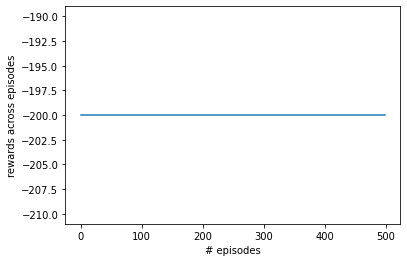

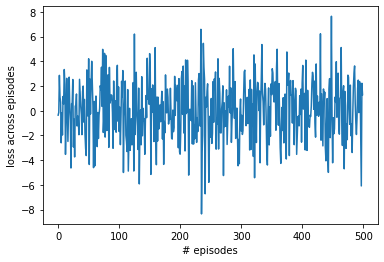

In [31]:
plt.plot(rewards_list)
plt.xlabel("# episodes")
plt.ylabel("rewards across episodes")
plt.show()

plt.plot(loss_list)
plt.xlabel("# episodes")
plt.ylabel("loss across episodes")
plt.show()

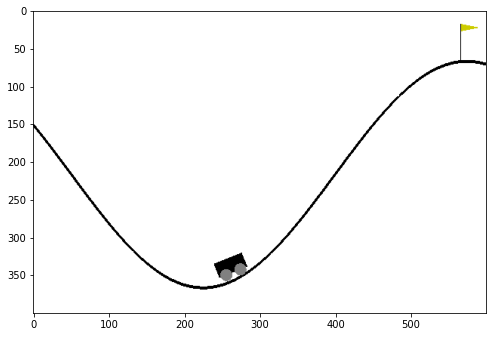

In [33]:
import matplotlib.animation as animation
import gnwrapper
from PIL import ImageFont, ImageDraw, Image
import numpy as np

agent.policymodel.eval()

env = gnwrapper.LoopAnimation(gym.make('MountainCar-v0'))
state = env.reset()

rewards = []
for step in range(500):
    # env.render()
    env.render(mode='rgb_array')
    # A = np.random.randint(0,3)
    # obs_next, rew, done, _ = env.step(A)
    action, logprob = agent.getProb(state)
    # print(action)
    state, reward, done, _ = env.step(action.item())
    # print(reward)
    rewards.append(reward)

    if done: break

env.display()


In [34]:
sum(rewards)

-200.0